# Modélisation

## Lagrangienne

On part du Lagrangien classique
$$L=\frac{m}{2}(\dot{x}^2+\dot{y}^2+\dot{z}^2)-mgz,$$

Puis on introduit les coordonnée sphériques
$$
\begin{cases}
x = r\sin(\theta)\cos(\phi)\\
y = r\sin(\theta)\sin(\phi)\\
z = r\cos(\theta)
\end{cases}
$$
où $r$ est constant mais $\theta$ et $\phi$ dépendent du temps.

On arrive alors au Lagrangien
$$
L=\frac{mr^2}{2}(\dot{\theta}^2+\sin^2(\theta)\dot{\phi}^2)-mgr\cos(\theta).
$$

Les équations d'Euler-Lagrange sont maintenant
$$
\begin{cases}
\ddot{\theta} = \sin(\theta)(\cos(\theta)\dot{\phi}^2+\frac{g}{r})\\
\sin^2(\theta)\left(\ddot{\phi}+\frac{2\dot{\theta}\dot{\phi}}{\tan(\theta)}\right) = 0
\end{cases}
$$

## Hamiltonienne

On introduit les coordonnées
$$
\begin{cases}
\alpha = mr^2\dot{\theta}\\
\beta = mr^2\sin^2(\theta)\dot{\phi}
\end{cases}
$$

Le Hamiltonien est alors
$$
H:=\dot{\theta}\alpha+\dot{\phi}\beta-L=\frac{\alpha^2}{2mr^2}+\frac{\beta^2}{2mr^2\sin^2(\theta)}+mgr\cos(\theta)
$$

Finalement on peut écrire les équations de Hamilton
$$
\begin{cases}
\dot{\theta} = \frac{\partial H}{\partial \alpha } = \frac{\alpha}{mr^2}\\
\dot{\phi} = \frac{\partial H}{\partial \beta } = \frac{\beta}{mr^2\sin^2(\theta)}\\
\dot{\alpha} = -\frac{\partial H}{\partial \theta} = mgr\sin(\theta)+\frac{\beta^2 \cos(\theta)}{mr^2\sin^3(\theta)}\\
\dot{\beta} = -\frac{\partial H}{\partial \phi } = 0
\end{cases}
$$

### Attention

On a une singularité dans le Lagrangien dûe au $\sin^2(\theta)$ au dénominateur. 

Cependant comme $H$ est une constante du mouvement, en prenant compte de la positivité des deux premiers termes et du caractère borné du troisième on n'est pas censé avoir explosion du point de vue théorique et numériquement tant que le Hamiltonien est à peu près conservé non plus.

# Simulation

## Calcul

In [1]:
import numpy as np
from scipy.integrate import odeint

In [2]:
m, g, r = 1, 10, 1

In [3]:
def flux(X, t):
    theta, phi, alpha, beta = X
    dtheta = alpha/(m*r**2)
    dphi = beta/(m*r**2*(np.sin(theta))**2)
    dalpha = m*g*r*np.sin(theta)+beta**2*np.cos(theta)/(m*r**2*(np.sin(theta))**3)
    dbeta = 0
    return np.array([dtheta, dphi, dalpha, dbeta])

In [4]:
ini = np.array([np.pi/2, 0, 0.5, 0.5])
temps = np.arange(0, 50, 0.05)

In [5]:
resultat = odeint(func=flux, y0=ini, t=temps)

## Affichage

In [6]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
from IPython.display import HTML

In [7]:
%matplotlib inline
plt.rc("figure", figsize=(12,9))
plt.rcParams["animation.writer"] = "avconv"

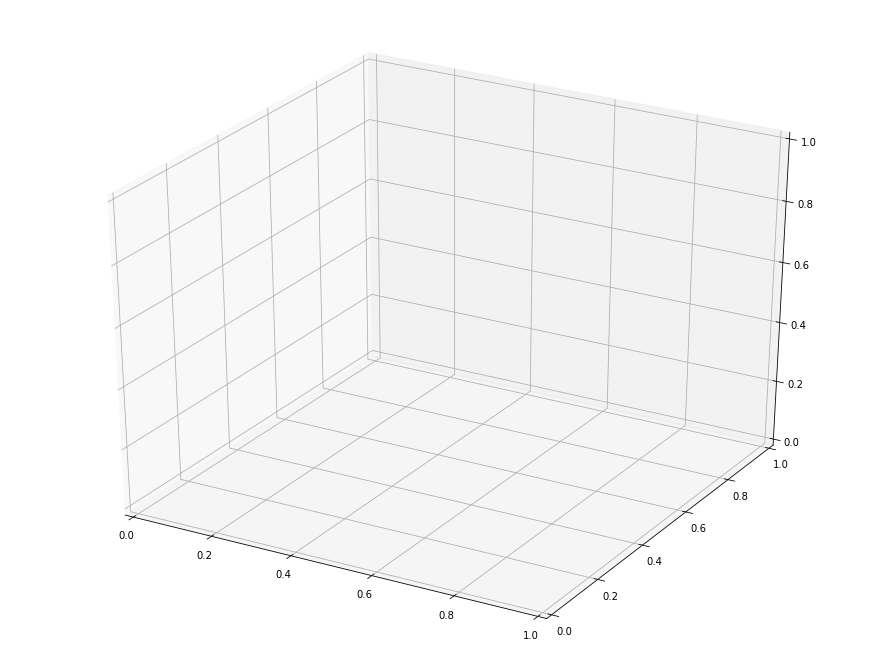

In [8]:
fig = plt.figure()
ax = Axes3D(fig)

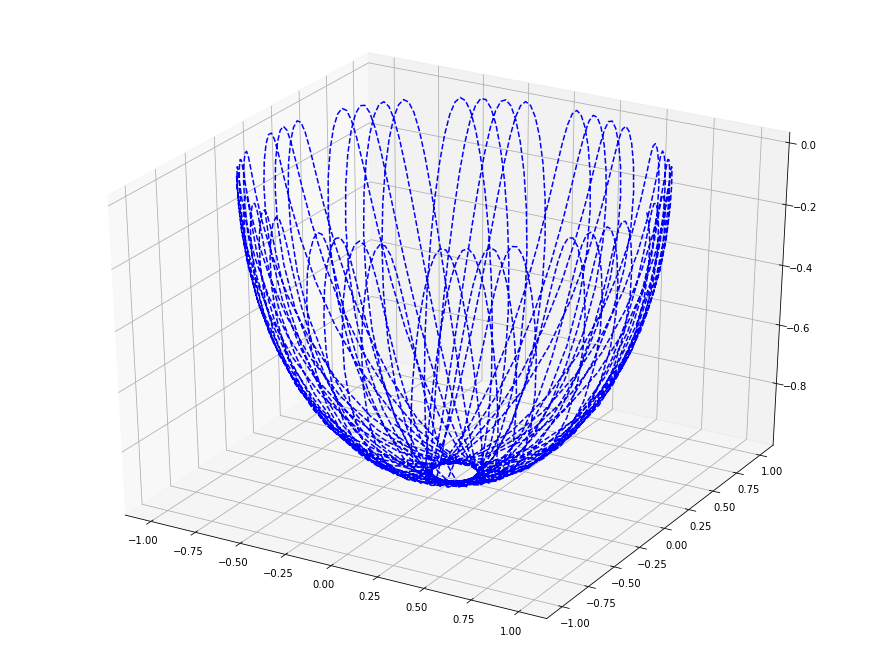

In [9]:
theta, phi =resultat[:,0], resultat[:,1]

x = r*np.sin(theta)*np.cos(phi)
y = r*np.sin(theta)*np.sin(phi)
z = r*np.cos(theta)
ligne, = ax.plot(x, y, z, ls="--", color="blue")
fig

## Animation

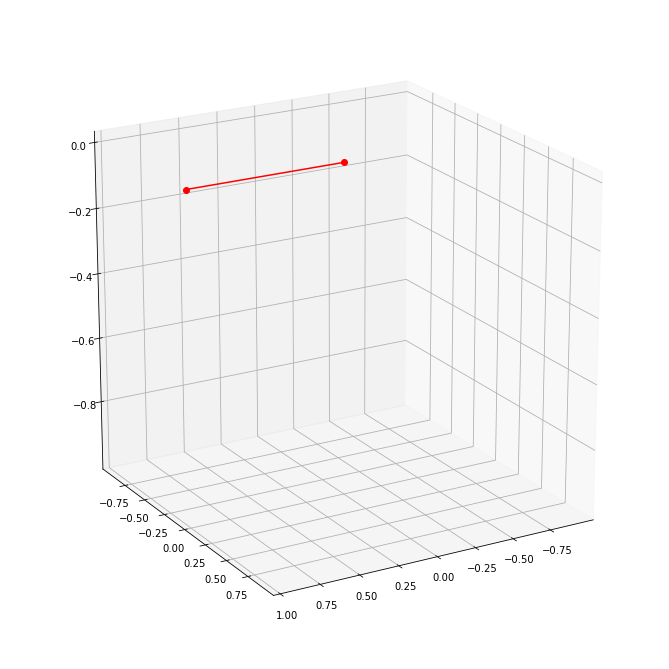

In [12]:
fig = plt.figure()
ax = Axes3D(fig)

traj, = ax.plot3D([], [], [], ls='--', color="blue")
tige, = ax.plot3D([], [], [], color="red", marker="o")
ax.set_xlim([np.min(x), np.max(x)])
ax.set_ylim([np.min(y), np.max(y)])
ax.set_zlim([np.min(z), np.max(z)])
ax.axes.set_aspect("equal")
ax.view_init(20, 60)

def maj(k):
    traj.set_data(x[:k], y[:k])
    traj.set_3d_properties(z[:k])
    tige.set_data([0, x[k]], [0, y[k]])
    tige.set_3d_properties([0, z[k]])
    ax.view_init(20, 60-0.1*k)
    return traj, tige

ani = FuncAnimation(fig=fig, func=maj, frames=range(len(x)), interval=50, blit=True)

In [13]:
HTML(ani.to_html5_video())